# Introducción al Machine Learning: Análisis de Engagement Estudiantil mediante Datos Biométricos

En este proyecto, nos adentraremos en el fascinante mundo del Machine Learning aplicado a la educación, específicamente en el análisis del engagement (compromiso) estudiantil durante sesiones de educación ideológica y política universitaria.

## Dataset y Objetivo
Trabajaremos con un conjunto de datos que incluye múltiples variables biométricas:
- Señales fisiológicas (ritmo cardíaco, conductancia de la piel, EEG)
- Indicadores físicos (temperatura, diámetro pupilar)
- Expresiones faciales (intensidad de sonrisa y ceño fruncido)
- Factores ambientales (nivel de ruido, iluminación)
- Marcadores biológicos (nivel de cortisol)
- Niveles de actividad

Nuestro objetivo es desarrollar un modelo de Machine Learning que pueda clasificar el nivel de engagement de los estudiantes en tres categorías: Altamente Comprometido, Moderadamente Comprometido y Desconectado.

## Importancia y Aplicación
Este análisis es fundamental para:
1. Proporcionar retroalimentación en tiempo real a los instructores
2. Optimizar las estrategias de enseñanza
3. Mejorar la experiencia educativa de los estudiantes
4. Desarrollar sistemas adaptativos de aprendizaje

A través de este proyecto, aprenderemos conceptos fundamentales de Machine Learning como:
- Preprocesamiento de datos
- Selección de características
- Entrenamiento de modelos
- Evaluación de rendimiento
- Visualización de resultados

Comencemos este viaje por el aprendizaje automático aplicado a la mejora de la educación.


In [13]:
# Importar las bibliotecas necesarias
import numpy as np
import pandas as pd
# Visualización
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler

# Configurar el estilo de las visualizaciones
plt.style.use('ggplot')
sns.set_palette("husl")

# Cargar el conjunto de datos desde el archivo CSV
df = pd.read_csv('data/emotional_monitoring_dataset_with_target.csv')






In [14]:
df

,HeartRate,SkinConductance,EEG,Temperature,PupilDiameter,SmileIntensity,FrownIntensity,CortisolLevel,ActivityLevel,AmbientNoiseLevel,LightingLevel,EmotionalState,CognitiveState,EngagementLevel
0,61,8.937204,11.794946,36.501723,3.330181,0.689238,0.189024,0.603035,136,59,394,engaged,distracted,3
1,60,12.635397,19.151412,36.618910,3.428995,0.561056,0.091367,0.566671,155,39,479,engaged,distracted,1
2,81,3.660028,6.226098,36.176898,2.819286,0.417951,0.227355,1.422475,55,30,832,partially engaged,focused,3
3,119,0.563070,4.542968,37.205293,2.192961,0.140186,0.502965,1.669045,39,40,602,disengaged,focused,3
4,118,0.477378,0.996209,37.248118,2.450139,0.064471,0.695604,1.854076,10,42,908,disengaged,focused,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,98,3.897648,7.681519,36.274526,2.624275,0.404309,0.204719,1.215872,65,50,913,partially engaged,distracted,2
996,109,0.439062,0.352790,37.173929,2.489483,0.070776,0.638161,1.826544,23,43,642,disengaged,distracted,2
997,108,1.077287,1.836462,37.073454,2.370298,0.011001,0.595518,1.781096,8,43,620,disengaged,distracted,2
998,76,14.260010,19.309704,36.708047,3.393744,0.653693,0.171151,0.783958,110,38,779,engaged,distracted,1


In [23]:
df.drop(columns=['EmotionalState', "CognitiveState"], inplace=True)


In [24]:
df

,HeartRate,SkinConductance,EEG,Temperature,PupilDiameter,SmileIntensity,FrownIntensity,CortisolLevel,ActivityLevel,AmbientNoiseLevel,LightingLevel,EngagementLevel
0,61,8.937204,11.794946,36.501723,3.330181,0.689238,0.189024,0.603035,136,59,394,3
1,60,12.635397,19.151412,36.618910,3.428995,0.561056,0.091367,0.566671,155,39,479,1
2,81,3.660028,6.226098,36.176898,2.819286,0.417951,0.227355,1.422475,55,30,832,3
3,119,0.563070,4.542968,37.205293,2.192961,0.140186,0.502965,1.669045,39,40,602,3
4,118,0.477378,0.996209,37.248118,2.450139,0.064471,0.695604,1.854076,10,42,908,3
...,...,...,...,...,...,...,...,...,...,...,...,...
995,98,3.897648,7.681519,36.274526,2.624275,0.404309,0.204719,1.215872,65,50,913,2
996,109,0.439062,0.352790,37.173929,2.489483,0.070776,0.638161,1.826544,23,43,642,2
997,108,1.077287,1.836462,37.073454,2.370298,0.011001,0.595518,1.781096,8,43,620,2
998,76,14.260010,19.309704,36.708047,3.393744,0.653693,0.171151,0.783958,110,38,779,1


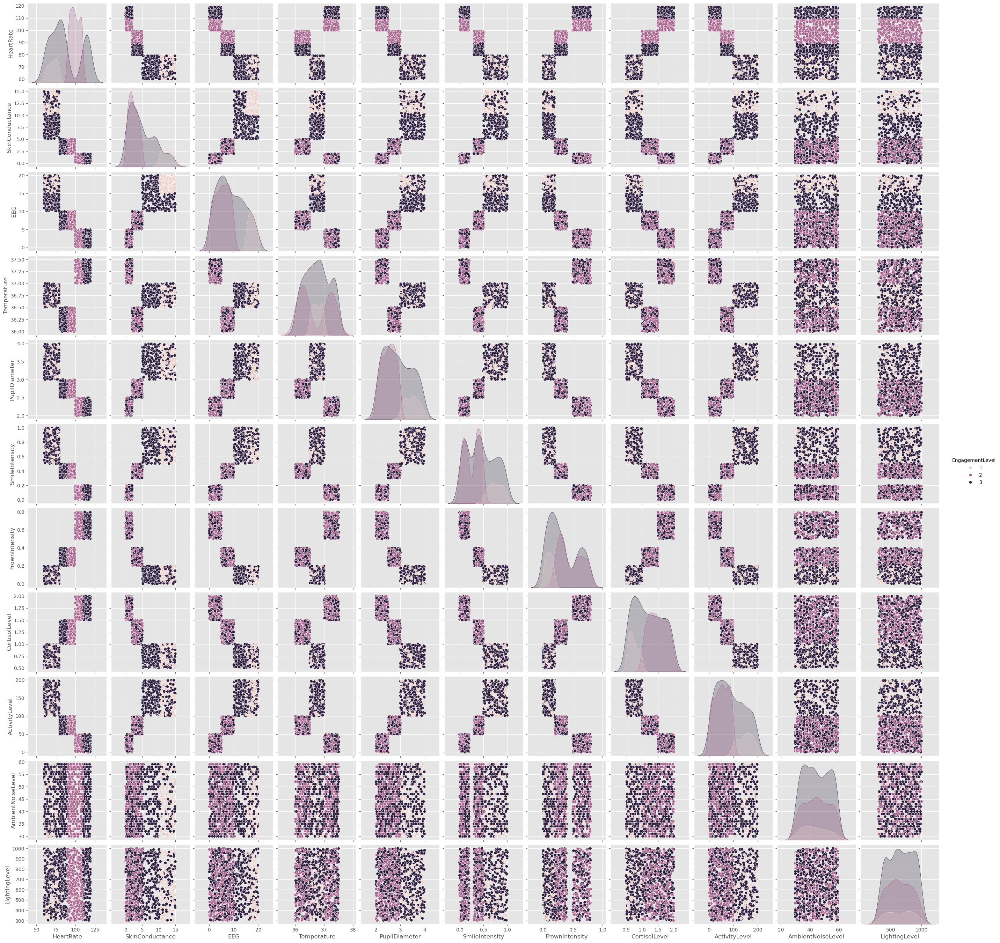

In [25]:

sns.pairplot(df, hue='EngagementLevel')



In [31]:
# Seleccionar las características y la variable objetivo
X = df[['HeartRate', 'PupilDiameter']]  # Ajustar según las columnas reales
y = df['EngagementLevel']  # Ajustar al nombre real de la columna objetivo

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Entrenar el modelo
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Realizar predicciones
y_pred = rf_model.predict(X_test)

# Crear una malla para visualizar las fronteras de decisión
x_min, x_max = X['HeartRate'].min() - 1, X['HeartRate'].max() + 1
y_min, y_max = X['PupilDiameter'].min() - 1, X['PupilDiameter'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02),
                     np.arange(y_min, y_max, 0.02))

Z = rf_model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Crear visualización interactiva con Plotly
fig = go.Figure()

# Agregar el mapa de contorno para las fronteras de decisión
fig.add_trace(go.Contour(
    x=np.arange(x_min, x_max, 0.02),
    y=np.arange(y_min, y_max, 0.02),
    z=Z,
    colorscale='RdYlBu',
    showscale=False,
    opacity=0.3
))

# Definir colores para cada clase
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Azul, Naranja, Verde
class_names = ['Bajo', 'Medio', 'Alto']

# Agregar los puntos de datos para cada clase
for i in range(3):
    mask = y == i+1  # Ajustado para coincidir con los niveles 1, 2, 3
    fig.add_trace(go.Scatter(
        x=X.loc[mask, 'HeartRate'],
        y=X.loc[mask, 'PupilDiameter'],
        mode='markers',
        name=f'Engagement {class_names[i]}',
        marker=dict(
            size=8,
            color=colors[i]
        )
    ))

# Actualizar el diseño
fig.update_layout(
    title='Clasificación de Niveles de Engagement con Random Forest',
    xaxis_title='Ritmo Cardíaco',
    yaxis_title='Conductancia de la Piel',
    template='plotly_white',
    width=900,
    height=600,
    legend=dict(
        title='Nivel de Engagement',
        yanchor="top",
        y=0.99,
        xanchor="right",
        x=0.99
    )
)

fig.show()

/home/robert/anaconda3/envs/Datascience/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



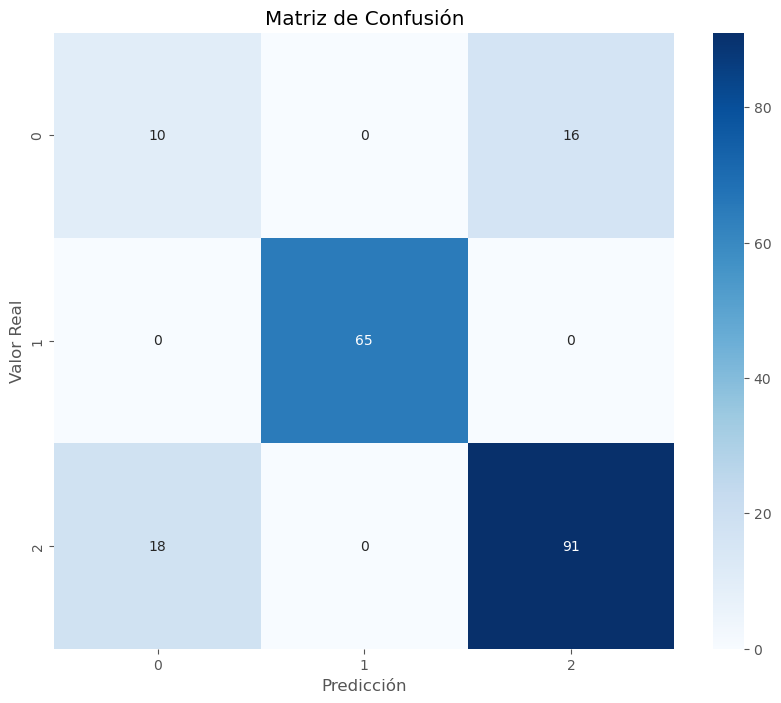


Informe de Clasificación:
              precision    recall  f1-score   support

           1       0.36      0.38      0.37        26
           2       1.00      1.00      1.00        65
           3       0.85      0.83      0.84       109

    accuracy                           0.83       200
   macro avg       0.74      0.74      0.74       200
weighted avg       0.83      0.83      0.83       200



In [32]:
# Visualizar la matriz de confusión
plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Matriz de Confusión')
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.show()

# Visualizar la importancia de las características
importances = rf_model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Característica': rf_model.feature_names_in_,
    'Importancia': importances
})

fig = px.bar(feature_importance_df, x='Característica', y='Importancia',
             title='Importancia de las Características',
             color='Importancia',
             color_continuous_scale='Viridis')
fig.show()

# Imprimir métricas de rendimiento
print("\nInforme de Clasificación:")
print(classification_report(y_test, y_pred))